<a href="https://colab.research.google.com/github/sadullahozcan/sarcopenia_eda_analysis/blob/main/EDA_03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df = pd.read_excel('/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_2.xlsx')

In [4]:
df.columns

Index(['Unnamed: 0', 'Name', 'Order', 'Gender', 'Age', 'Weight', 'Height',
       'Waist', 'Hip', 'Smoking', 'Smoking_packet_per_year', 'Alcohol',
       'DM_Type2', 'DM_Type2_Duration', 'Insulin', 'DM_Type2_Drug',
       'DM_Type2_Drug_Usage', 'Dyslipidemia', 'Dyslipidemia_duration', 'KAH',
       'KAH_Duration', 'Hipotiroidi', 'Asthma', 'COPD', 'OP', 'HT',
       'Duration_of_HT', 'N_HT', 'HT_drugs', 'HT_Drug_Usage',
       'Duration_of_1HT', 'Education', 'Job', 'Status', 'Work_Status',
       'Exercise', 'Exercise_Status', 'AT', 'CST', 'Gait_Speed', 'Grip_Str',
       'STAR', 'BMI', 'MMSE', 'Sarcopenia'],
      dtype='object')

In [5]:
df.drop(columns=["Unnamed: 0"], inplace=True)

In [6]:
df.columns

Index(['Name', 'Order', 'Gender', 'Age', 'Weight', 'Height', 'Waist', 'Hip',
       'Smoking', 'Smoking_packet_per_year', 'Alcohol', 'DM_Type2',
       'DM_Type2_Duration', 'Insulin', 'DM_Type2_Drug', 'DM_Type2_Drug_Usage',
       'Dyslipidemia', 'Dyslipidemia_duration', 'KAH', 'KAH_Duration',
       'Hipotiroidi', 'Asthma', 'COPD', 'OP', 'HT', 'Duration_of_HT', 'N_HT',
       'HT_drugs', 'HT_Drug_Usage', 'Duration_of_1HT', 'Education', 'Job',
       'Status', 'Work_Status', 'Exercise', 'Exercise_Status', 'AT', 'CST',
       'Gait_Speed', 'Grip_Str', 'STAR', 'BMI', 'MMSE', 'Sarcopenia'],
      dtype='object')

# **Multi-variate Analysis**

**Correlation Matrix of Values**

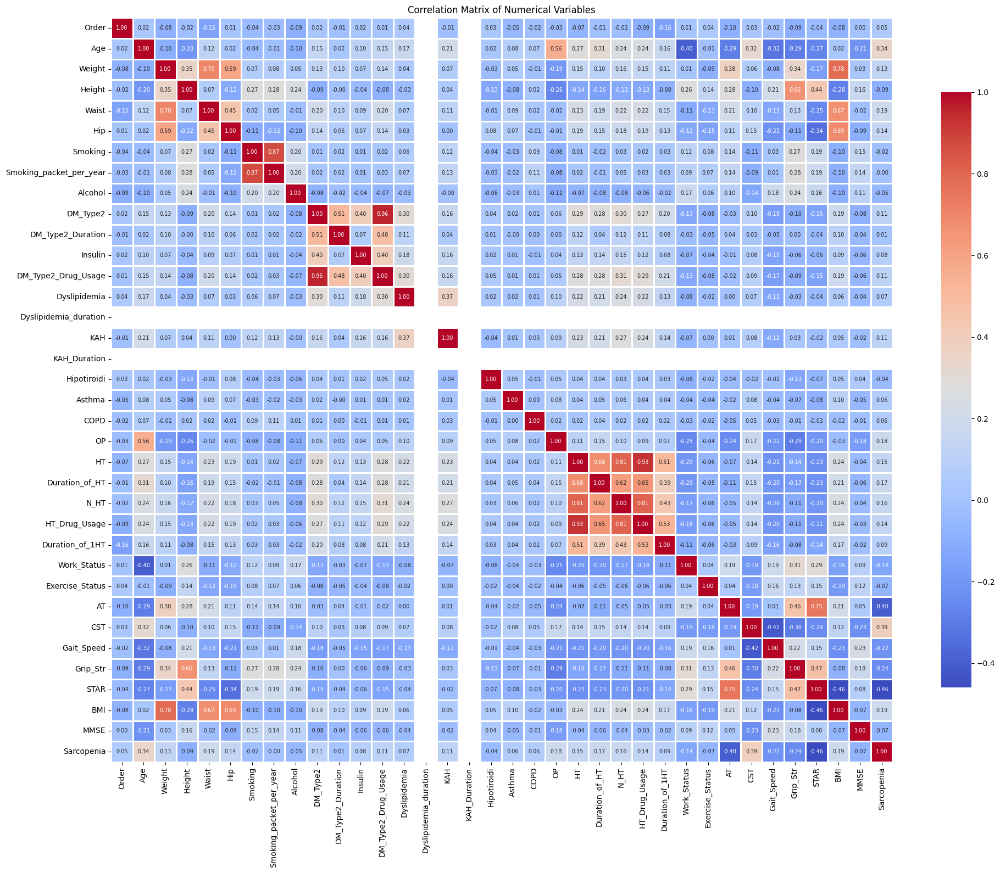

In [7]:
df_numeric = df.select_dtypes(include=np.number)
correlation_matrix = df_numeric.corr().round(2)

num_cols = len(df_numeric.columns)

fig_width = num_cols * 0.8 # Her sütun/satır için yaklaşık 0.7 inç ayırıyoruz
fig_height = num_cols * 0.8

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 16)) # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f",linewidths=1,cbar_kws={'shrink': 0.8},
    annot_kws={"fontsize": 7})
plt.title('Correlation Matrix of Numerical Variables')

plt.xticks(rotation=90, fontsize=10)  # X ekseni etiketlerini dikey yap ve font boyutunu ayarla
plt.yticks(rotation=0, fontsize=10) # Y ekseni etiketlerini yatay bırak ve font boyutunu ayarla

# Grafiklerin düzenini optimize edelim ve çakışmaları önleyelim
plt.tight_layout()
plt.show()

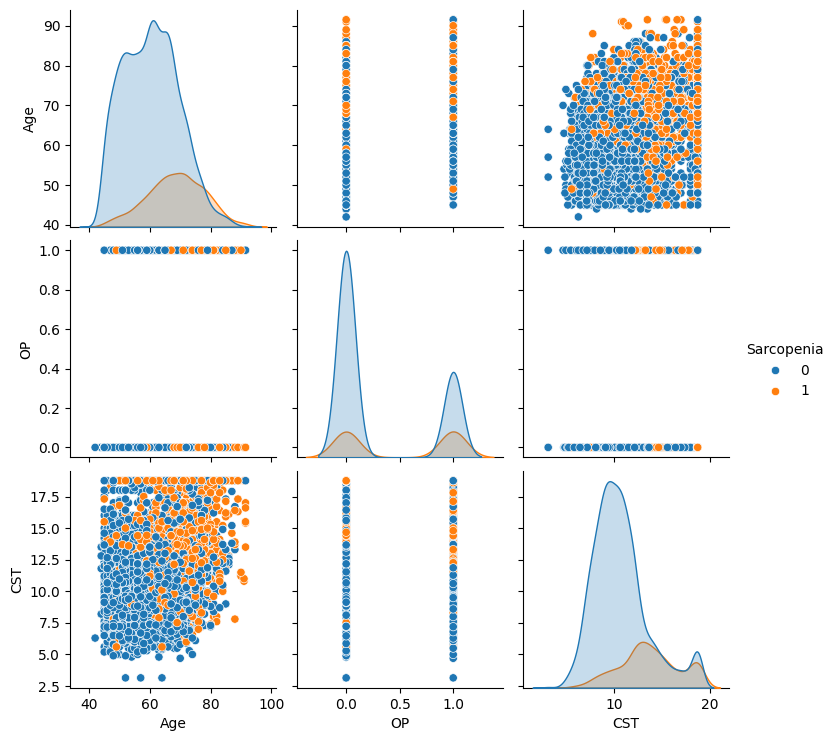

In [8]:
sns.pairplot(df[['Age', 'OP', 'CST', 'Sarcopenia']], hue='Sarcopenia')

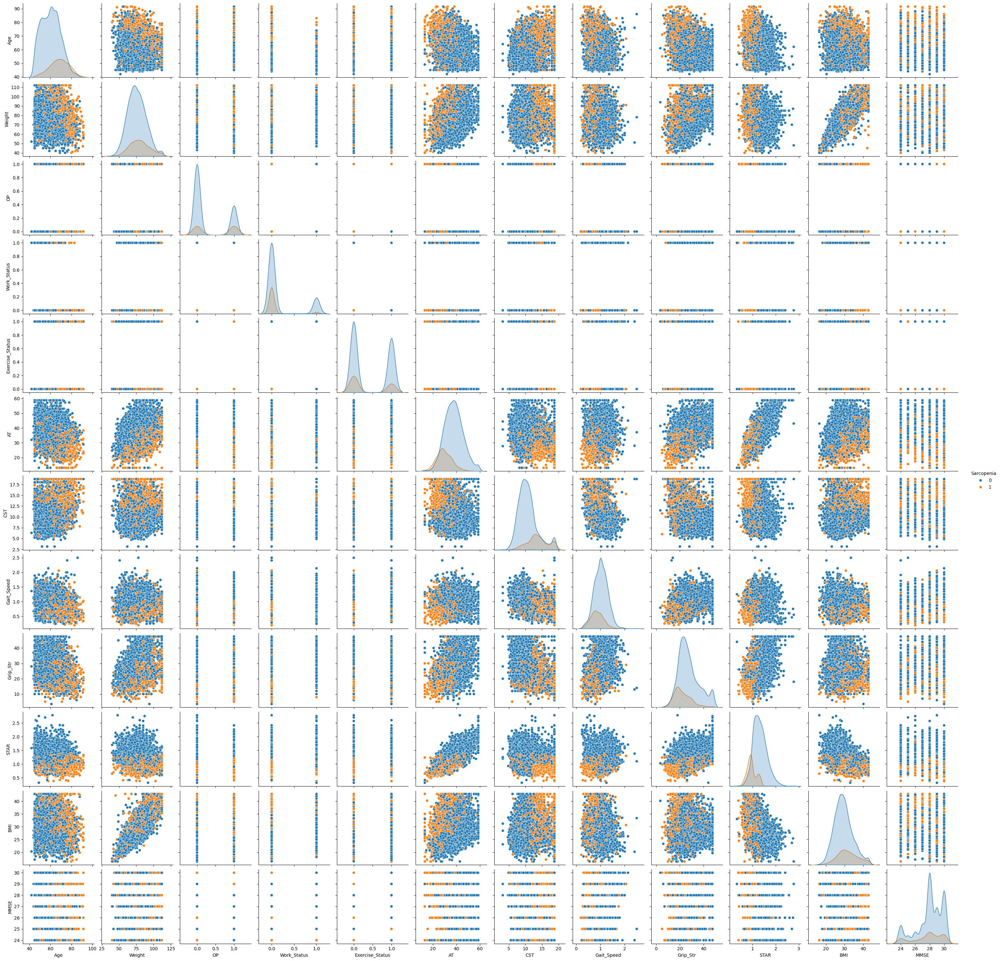

In [9]:
sns.pairplot(df[['Age', 'Weight', 'OP', 'Work_Status', 'Exercise_Status', 'AT', 'CST',
'Gait_Speed', 'Grip_Str', 'STAR', 'BMI', 'MMSE', 'Sarcopenia']], hue='Sarcopenia')

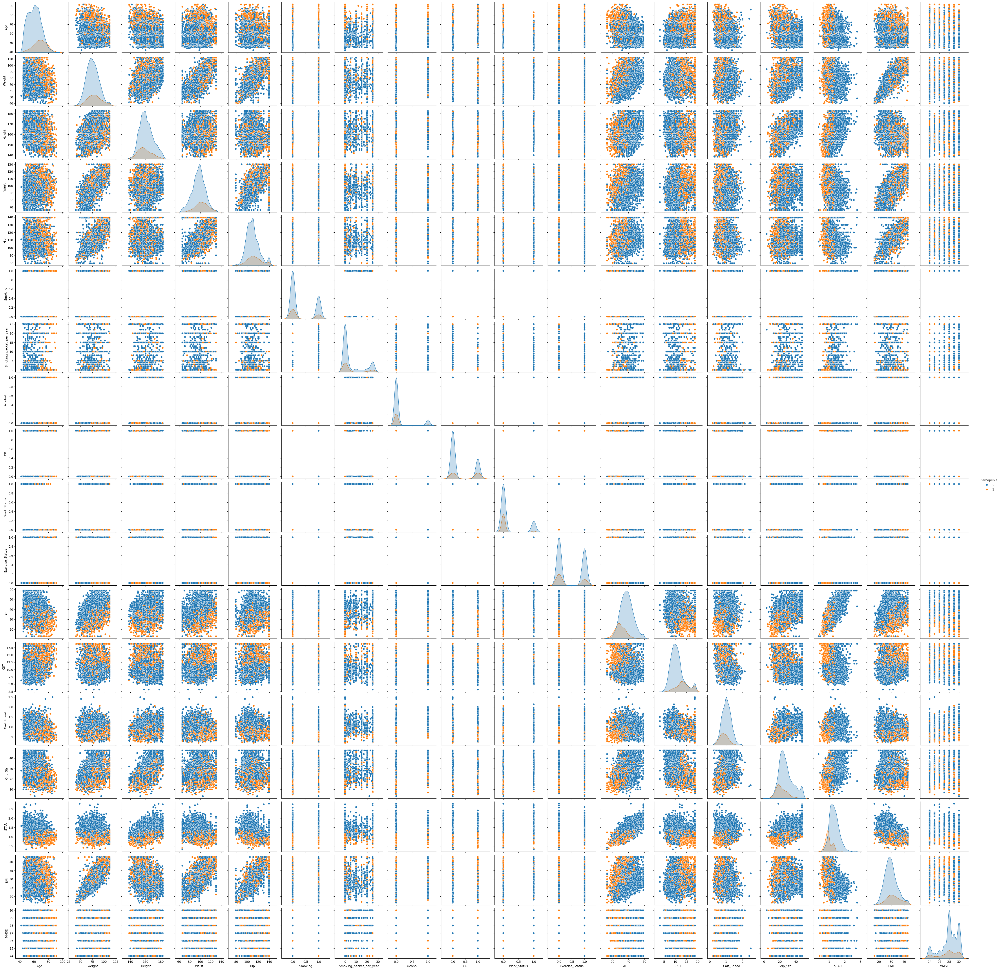

In [10]:
sns.pairplot(df[['Age', 'Weight', 'Height', 'Waist', 'Hip','Smoking', 'Smoking_packet_per_year', 'Alcohol', 'OP', 'Work_Status', 'Exercise_Status', 'AT', 'CST',
'Gait_Speed', 'Grip_Str', 'STAR', 'BMI', 'MMSE', 'Sarcopenia']], hue='Sarcopenia')

In [11]:
df.columns

Index(['Name', 'Order', 'Gender', 'Age', 'Weight', 'Height', 'Waist', 'Hip',
       'Smoking', 'Smoking_packet_per_year', 'Alcohol', 'DM_Type2',
       'DM_Type2_Duration', 'Insulin', 'DM_Type2_Drug', 'DM_Type2_Drug_Usage',
       'Dyslipidemia', 'Dyslipidemia_duration', 'KAH', 'KAH_Duration',
       'Hipotiroidi', 'Asthma', 'COPD', 'OP', 'HT', 'Duration_of_HT', 'N_HT',
       'HT_drugs', 'HT_Drug_Usage', 'Duration_of_1HT', 'Education', 'Job',
       'Status', 'Work_Status', 'Exercise', 'Exercise_Status', 'AT', 'CST',
       'Gait_Speed', 'Grip_Str', 'STAR', 'BMI', 'MMSE', 'Sarcopenia'],
      dtype='object')

In [12]:
df.groupby('Gender')[['Gait_Speed','BMI','Smoking','Alcohol','DM_Type2','Work_Status','Exercise_Status','CST','Grip_Str','STAR','MMSE']].mean()

,Gait_Speed,BMI,Smoking,Alcohol,DM_Type2,Work_Status,Exercise_Status,CST,Grip_Str,STAR,MMSE
Gender,,,,,,,,,,,
F,0.977923,30.348558,0.220786,0.060489,0.303822,0.119604,0.373110,11.489359,22.697141,1.160622,27.804509
M,1.018298,28.379142,0.583031,0.200870,0.306019,0.262509,0.530094,10.673401,35.947281,1.447683,28.303118


In [13]:
df.groupby("Sarcopenia")[["Age","Weight","Height", 'Waist', 'Hip',
       'Smoking', 'Smoking_packet_per_year','DM_Type2_Duration', 'Dyslipidemia_duration', 'KAH_Duration',
      'Duration_of_HT','Duration_of_1HT', 'AT', 'CST','Gait_Speed', 'Grip_Str', 'STAR', 'BMI', 'MMSE']].mean()

,Age,Weight,Height,Waist,Hip,Smoking,Smoking_packet_per_year,DM_Type2_Duration,Dyslipidemia_duration,KAH_Duration,Duration_of_HT,Duration_of_1HT,AT,CST,Gait_Speed,Grip_Str,STAR,BMI,MMSE
Sarcopenia,,,,,,,,,,,,,,,,,,,
0,60.334625,75.643378,160.831621,96.792056,109.646556,0.325244,5.817863,0.458411,0.0,0.0,4.493529,1.778734,37.80965,10.643868,1.021058,27.412409,1.312666,29.322805,28.008006
1,68.506869,79.861277,158.961703,102.619803,113.577647,0.301276,5.728165,0.486387,0.0,0.0,7.302591,2.525908,29.66268,13.701551,0.863364,22.132875,0.952711,31.706859,27.681060


In [14]:
df.Age.max()

91.5

In [15]:
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 40, 65, 100], labels=['0-40 YAŞ', '40-65 YAŞ', '65-100 YAŞ'])

In [16]:
df.insert(4, 'Age_Group', df.pop('Age_Group'))

In [17]:
df.columns

Index(['Name', 'Order', 'Gender', 'Age', 'Age_Group', 'Weight', 'Height',
       'Waist', 'Hip', 'Smoking', 'Smoking_packet_per_year', 'Alcohol',
       'DM_Type2', 'DM_Type2_Duration', 'Insulin', 'DM_Type2_Drug',
       'DM_Type2_Drug_Usage', 'Dyslipidemia', 'Dyslipidemia_duration', 'KAH',
       'KAH_Duration', 'Hipotiroidi', 'Asthma', 'COPD', 'OP', 'HT',
       'Duration_of_HT', 'N_HT', 'HT_drugs', 'HT_Drug_Usage',
       'Duration_of_1HT', 'Education', 'Job', 'Status', 'Work_Status',
       'Exercise', 'Exercise_Status', 'AT', 'CST', 'Gait_Speed', 'Grip_Str',
       'STAR', 'BMI', 'MMSE', 'Sarcopenia'],
      dtype='object')

In [18]:
df.Age_Group.value_counts()

,count
Age_Group,
40-65 YAŞ,3185
65-100 YAŞ,1831
0-40 YAŞ,0


# **Data Type Verification and Consistency**

In [19]:
def rename_duplicates_in_excel(file_path, column_name):
    """
    Excel dosyasındaki belirtilen sütunda aynı isimleri
    isim + sıra numarası (0'dan başlayarak) şeklinde yeniden adlandırır.

    Args:
        file_path (str): Excel dosyasının yolu (örn: 'verilerim.xlsx').
        column_name (str): Yeniden adlandırılacak isimlerin bulunduğu sütunun adı.
    """
    try:
        # Excel dosyasını oku
        df = pd.read_excel(file_path)
    except FileNotFoundError:
        print(f"Hata: '{file_path}' dosyası bulunamadı. Lütfen dosya yolunu kontrol edin.")
        return
    except Exception as e:
        print(f"Excel dosyasını okurken bir hata oluştu: {e}")
        return

    # Belirtilen sütunun DataFrame'de olup olmadığını kontrol et
    if column_name not in df.columns:
        print(f"Hata: '{column_name}' sütunu dosyada bulunamadı. Lütfen sütun adını kontrol edin.")
        return

    # Her bir ismin kaç kez görüldüğünü takip etmek için bir sözlük
    name_counts = {}
    new_names = []

    # Sütundaki her bir isim üzerinde döngü yap
    for name in df[column_name]:
        if pd.isna(name): # NaN (boş) değerleri atla
            new_names.append(name)
            continue

        name_str = str(name) # İsimleri string'e dönüştür

        if name_str in name_counts:
            # İsim daha önce görüldüyse, sayacı artır ve yeni ismi oluştur
            count = name_counts[name_str]
            new_name = f"{name_str} {count}"
            name_counts[name_str] += 1
        else:
            # İsim ilk kez görülüyorsa, sözlüğe ekle ve sayacı 1 olarak başlat (ilk sıra numarası 0 olacak)
            new_name = f"{name_str} 0"
            name_counts[name_str] = 1 # Sonraki aynı isim için 1'den başlayacak

        new_names.append(new_name)

    # DataFrame'deki ilgili sütunu güncel yeni isimlerle değiştir
    df[column_name] = new_names

    # Değiştirilmiş DataFrame'i yeni bir Excel dosyasına kaydet
    # Orijinal dosyanın üzerine yazmamak için farklı bir isim kullanmak iyi bir uygulamadır.
    output_file_path = file_path.replace(".xlsx", "_yenilenmis.xlsx").replace(".xls", "_yenilenmis.xls")
    try:
        df.to_excel(output_file_path, index=False)
        print(f"İsimler başarıyla yeniden adlandırıldı ve '{output_file_path}' olarak kaydedildi.")
    except Exception as e:
        print(f"Yeni Excel dosyasını kaydederken bir hata oluştu: {e}")


In [20]:
# Dosya yolu ve sütun adı
excel_dosyasi_drive = '/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_2.xlsx' # Kendi yolunuzu belirtin
isim_sutunu = 'Name' # Buraya isimlerin olduğu sütunun adını yazın (Büyük/küçük harf duyarlıdır!)

# Fonksiyonu çalıştır
rename_duplicates_in_excel(excel_dosyasi_drive, isim_sutunu)


İsimler başarıyla yeniden adlandırıldı ve '/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_2_yenilenmis_yenilenmis.xlsx' olarak kaydedildi.


In [22]:
df = pd.read_excel('/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_2_yenilenmis.xlsx')

In [23]:
df.Name.value_counts()

,count
Name,
ÖZDEN 81,1
beyzanur 0,1
beyzanur 1,1
beyzanur 2,1
beyzanur 3,1
...,...
beyzanur 12,1
beyzanur 11,1
beyzanur 10,1


In [24]:
df = df.round(decimals=2)

In [25]:
df.iloc[[160], [df.columns.get_loc("Weight")]]

,Weight
160,76.58


# **String Columns Parsing**

In [26]:
import re

In [27]:
def create_dummy_columns_optimized(df, text_column, delimiters):
    """
    Excel dosyasındaki belirtilen metin sütunundaki verileri,
    belirtilen ayraçlara göre ayırır ve her bir benzersiz veriyi
    yeni bir sütun olarak ekler. İlgili satıra 1, diğer yerlere 0 koyar.
    Performans optimizasyonu yapılmıştır.

    Args:
        df (pd.DataFrame): Üzerinde işlem yapılacak DataFrame.
        text_column (str): İşlem yapılacak metin sütununun adı.
        delimiters (list): Verileri ayırmak için kullanılacak ayraçların listesi (örn: [',', '+', '/']).

    Returns:
        pd.DataFrame: Yeni dummy sütunları eklenmiş DataFrame.
    """
    # DataFrame'in bir kopyasını alarak orijinalinin değiştirilmesini önleyelim
    # ve fragmentation uyarısını hafifletelim
    df_copy = df.copy()

    # Ayraçları düzenli ifade (regex) formatına getir
    regex_pattern = '|'.join(map(re.escape, delimiters))

    # Boş veya NaN değerleri olan satırları atlamak için
    # string'e dönüştür ve boşlukları temizle
    temp_series = df_copy[text_column].fillna('').astype(str).str.strip()

    # Verileri ayraçlara göre böler ve her bir parçayı listeye dönüştürür
    # .apply(lambda x: re.split(...)) ile her hücreyi bölelim
    # .explode() ile listeleri patlatalım
    all_items = temp_series.apply(lambda x: re.split(regex_pattern, x)).explode()

    # Boşlukları ve gereksiz karakterleri temizle (tekrar emin olmak için)
    all_items = all_items.str.strip()

    # Boş stringleri ve NaN değerleri temizle
    all_items = all_items[all_items != '']
    all_items = all_items.dropna()

    # Benzersiz öğeleri al
    unique_items = all_items.unique()

    # Tüm yeni sütunlar için boş bir DataFrame oluştur
    new_columns_df = pd.DataFrame(0, index=df_copy.index, columns=unique_items)

    # Her bir satır için ilgili sütunlara 1 değerini ata
    for index, row_text in temp_series.items():
        if row_text: # Boş olmayan satırları işle
            # Satırdaki metni ayraçlara göre bölelim
            items_in_row = [item.strip() for item in re.split(regex_pattern, row_text) if item.strip()]
            for item in items_in_row:
                if item in new_columns_df.columns: # Oluşturduğumuz sütunlarda varsa
                    new_columns_df.loc[index, item] = 1

    # Orijinal DataFrame ile yeni sütunları birleştir
    df_result = pd.concat([df_copy, new_columns_df], axis=1)

    return df_result

In [28]:
text_column = 'DM_Type2_Drug'
delimiters = [',', '+']
df2 =df.copy()

df_processed_optimized = create_dummy_columns_optimized(df2, text_column, delimiters)

In [29]:
df_processed_optimized

,Unnamed: 0,Name,Order,Gender,Age,Weight,Height,Waist,Hip,Smoking,...,JANUMET,NOVOMİX JARDİANCE,RYZODEG,NOVORAPİD,JARDİANCE,LANTUS NOVORAPİD,TRAJENT,GLİFOR,EMPAGLİFLOZİN,humalog
0,0,beyzanur 0,1,M,74.0,88.0,178.0,113.0,113.0,1,...,0,0,0,0,0,0,0,0,0,0
1,1,beyzanur 1,2,M,62.0,105.0,172.0,125.0,110.0,1,...,0,0,0,0,0,0,0,0,0,0
2,2,beyzanur 2,3,M,65.0,89.0,169.0,110.0,114.0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,beyzanur 3,4,F,71.0,68.0,160.0,103.0,100.0,1,...,0,0,0,0,0,0,0,0,0,0
4,4,beyzanur 4,5,F,61.0,80.0,160.0,102.0,105.0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5011,5011,ÖZDEN 77,5012,F,70.0,73.0,143.0,103.0,111.0,0,...,0,0,0,0,0,0,0,0,0,0
5012,5012,ÖZDEN 78,5013,F,72.0,78.0,160.0,100.0,108.0,0,...,0,0,0,0,0,0,0,0,0,0
5013,5013,ÖZDEN 79,5014,M,79.0,95.0,180.0,100.0,114.0,0,...,0,0,0,0,0,0,0,0,0,0
5014,5014,ÖZDEN 80,5015,M,85.0,96.0,161.0,106.0,107.0,0,...,0,0,0,0,0,0,0,0,0,0


In [30]:
df_processed_optimized.columns

Index(['Unnamed: 0', 'Name', 'Order', 'Gender', 'Age', 'Weight', 'Height',
       'Waist', 'Hip', 'Smoking',
       ...
       'JANUMET', 'NOVOMİX JARDİANCE', 'RYZODEG', 'NOVORAPİD', 'JARDİANCE',
       'LANTUS NOVORAPİD', 'TRAJENT', 'GLİFOR', 'EMPAGLİFLOZİN', 'humalog'],
      dtype='object', length=327)

**Çok fazla ilaç çeşitliliği var. DM_Type2_Drug kolonunu ilaç türü bazında ayırmak çok anlamlı değil. Aynı durum "HT_Drugs" kolononda yer alan bilgiler içinde geçerli. Dolayısıyla bundan sonrasında yine orijinal df ile devam edilecek.**

In [31]:
df.to_excel('/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_3.xlsx')

# **Consistency Analysis on Job and Status Columns**

In [32]:
job_list = df['Job'].unique()

In [33]:
job_list.sort()

In [34]:
print(job_list)

['Academician' 'Accountant' 'Anesthesia technician' 'Architecture'
 'Assembler' 'BANK WORKER' 'Bank clark' 'Bank clerk' 'Bank manager'
 'Bank officer' 'Bank worker' 'Barber' 'Beautician' 'Bilgisayar operatörü'
 'Caregiver' 'Civil servant' 'Cleaner' 'Cleaning staff' 'Cleaning worke'
 'Cleaning worker' 'Coiffeur' 'Construction engineer'
 'Construction worker' 'Craft' 'DENTIST' 'Digger operator' 'Doctor'
 'Doktor' 'Draper' 'Driver' 'EMEKLİ' 'EMEKLİ ÖĞRETMEN' 'ESNAF' 'EV HANIMI'
 'Editor' 'Elektirik Teknikeri' 'Emekli eğitmen' 'Employer' 'Engineer'
 'Esnaf' 'Ev Hanımı' 'Ev hanımı' 'Financial advisor' 'Freelance' 'HEMŞİRE'
 'Hairdresser' 'Hastane Personeli' 'Hastane personeli'
 'Hava Yolları Çalışanı' 'Hemşire' 'Hospital Staff' 'House wife'
 'Housewife' 'Jeweler' 'Journalist' 'Kasiyer' 'Kaynakçı' 'Kazan Ustası'
 'Kuaför' 'LAWYER' 'Lab technician' 'Lawyer' 'Maid' 'Manager'
 'Medical Secretary' 'Memur' 'Metal İşçisi' 'Military officer' 'Mimar'
 'Muhasebeci' 'MÜDÜR' 'MÜHENDİS' 'Mühendis' 'Nurs

In [35]:
# Replace 'Unknown' with NaN (Not a Number) for consistency, making it a true missing value
df['Job'] = df['Job'].replace('Unknown',np.nan)

In [36]:
for col in ['Job',]:
    if col in df.columns:
        df[col] = df[col].astype(str).str.lower().str.strip() # Convert to string first to avoid errors with NaN
    else:
        print(f"Warning: Column '{col}' not found in DataFrame.")

print("\nUnique values in 'Job' column (after case normalization and stripping):")
print(df['Job'].unique())


Unique values in 'Job' column (after case normalization and stripping):
['judge' 'chauffeur' 'soldier' 'bank clerk' 'teacher' 'housewife'
 'construction worker' 'nurse' 'oto mechanic' 'worker' 'carrier' 'police'
 'officer' 'engineer' 'welder' 'delivery man' 'retired' 'musician'
 'tailor' 'farmer' 'architect' 'plumber' 'painter' 'inspector' 'chef'
 'banker' 'marketer' 'electrical technician' 'chief clerk' 'land agent'
 'auto painter' 'contractor' 'butcher' 'repairman' 'curtain man'
 'security guard' 'constructer' 'employee' 'menager' 'tradesman' 'imam'
 'accountant' 'constructor' 'cleaner' 'driver' 'seller' 'deputy' 'doctor'
 'chief constable' 'secretary' 'academician, artist' 'self-employed'
 'project manager in transportation' 'artisan' 'waiter' 'housekeeper'
 'nan' 'notary' 'social worker' 'hospital staff' 'employer' 'waitress'
 'office worker' 'police officer' 'maid' 'pharmacist assistant'
 'civil servant' 'textile exporter' 'shop assistant' 'beautician'
 'goverment officer' 'care 

In [37]:
status_list = df['Status'].unique()

In [38]:
status_list.sort()

In [39]:
print(status_list)

['Full time' 'Full-time' 'Full-time/part-time work' 'Full/part time work'
 'Kısmi çalışıyor' 'Not Working' 'TAM/KISMİ ÇALIŞIYOR'
 'Tam zamanlı çalışıyor' 'Tam/kısmi zamanlı' 'Tam/kısmi zamanlı çalışıyor'
 'Unknown' 'Working' 'actively working' 'aktif çalışan' 'calısıyor'
 'full time' 'full time work' 'full-time/part-time work' 'full/part time'
 'full/part time work' 'full/part time worker' 'kısmi' 'part time work'
 'tam veya kısmı zamanlı calısıyor' 'tam zamanlı'
 'tam/kısmi zamanlı çalışıyor' 'tam/kısmi zamnalı çalışıyor'
 'ull-time/part-time work' 'worker' 'working' 'workşng' 'ÇALIŞIYOR'
 'Çalışıyor' 'çalışıyor']


In [40]:
for col in ['Status',]:
    if col in df.columns:
        df[col] = df[col].astype(str).str.lower().str.strip() # Convert to string first to avoid errors with NaN
    else:
        print(f"Warning: Column '{col}' not found in DataFrame.")

print("\nUnique values in 'Status' column (after case normalization and stripping):")
print(df['Status'].unique())


Unique values in 'Status' column (after case normalization and stripping):
['not working' 'working' 'unknown' 'full/part time worker' 'full time'
 'part time work' 'full-time' 'full-time/part-time work'
 'ull-time/part-time work' 'full/part time work' 'full/part time'
 'full time work' 'tam/kısmi zamanlı çalışıyor' 'workşng' 'çalişiyor'
 'calısıyor' 'kısmi çalışıyor' 'actively working' 'çalışıyor'
 'tam/kısmi zamnalı çalışıyor' 'kısmi' 'tam zamanlı çalışıyor'
 'tam/kismi̇ çalişiyor' 'tam veya kısmı zamanlı calısıyor' 'worker'
 'tam zamanlı' 'tam/kısmi zamanlı' 'aktif çalışan']


In [41]:
df.to_excel('/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_3.xlsx')

**Data standardization and translation is done by MS Excel. To some extend, grouping similar occupations is also performed to facilitate analysis.Studied file is read as new dataframe.**

In [42]:
df = pd.read_excel('/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_3_job_status_studied.xlsx')

In [43]:
df.Job.value_counts()

,count
Job,
housewife,2256
worker,432
public officer,315
retired or not working,307
retired,163
...,...
babysitter,1
modelist,1
general store,1


In [44]:
df.Status.value_counts()

,count
Status,
not working,4046
working,797
unknown,173


The interpretation of "0" values in duration fields, in conjunction with binary flags for medical conditions, necessitates careful consideration to accurately reflect the absence or recent onset of a condition. Let's change "0" durations into "0.01" where there is an illness but no duration.

In [45]:
df['DM_Type2_Duration'] = df.apply(lambda row: 0.01 if row['DM_Type2'] == 1 and row['DM_Type2_Duration'] == 0 else row['DM_Type2_Duration'], axis=1)

In [46]:
df["Duration_of_HT"] = df.apply(lambda row: 0.01 if row['HT'] == 1 and row['Duration_of_HT'] == 0 else row['Duration_of_HT'], axis=1)

In [47]:
df["Duration_of_1HT"] = df.apply(lambda row: 0.01 if row['HT'] == 1 and row['Duration_of_1HT'] == 0 else row['Duration_of_1HT'], axis=1)

In [48]:
df["Dyslipidemia_duration"] = df.apply(lambda row: 0.01 if row['Dyslipidemia'] == 1 and row['Dyslipidemia_duration'] == 0 else row['Dyslipidemia_duration'], axis=1)

In [49]:
df["KAH_Duration"] = df.apply(lambda row: 0.01 if row['KAH'] == 1 and row['KAH_Duration'] == 0 else row['KAH_Duration'], axis=1)

In [50]:
df.to_excel('/content/drive/MyDrive/SARCOPENIA_PROJECT/sarcopenia-data-set_columns_corrected_3_final.xlsx')